In [1]:
import numpy as np
import mne
import matplotlib
%matplotlib inline
#%matplotlib qt
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import glob, os
import scipy
import pickle
import networkx as nx
import preprocessing as prep
from itertools import permutations
import pandas as pd
from tqdm import tqdm

from epoch_connectivity import ConnEEG as cnegg
from epoch_connectivity import ConnectionMatrices as cm
from epoch_connectivity import Connectomes as cntms

from epoch_connectivity.utils import FrequencyBand, only_EEG_channels

import mne_connectivity as mnecon

In [2]:
# Patients metadata, because the folders are different and require different approachs (some have SEVRAGE and H1)

# To dfine the VERBOSE level for mne
mne.set_log_level(verbose='WARNING')
direc = 'C:/code_thesis/brain_connectivity_epilepsy/plots/' # directory to save the plots
direc_pickle = 'C:/code_thesis/brain_connectivity_epilepsy/connection_matrices/' # directory to save the pickles

# pat number : sevrage (bool)
PAT_metadata = {'PAT1':False, 'PAT2':False, 'PAT3':False, 'PAT4':True, 'PAT5':False, 'PAT6':True,
               'PAT7':True, 'PAT8':False, 'PAT9':True, 'PAT10':True, 'PAT11':True, 'PAT12':True,
               'PAT13':True, 'PAT14':False, 'PAT15':False, 'PAT16':False, 'PAT17':False, 'PAT18':False,
               'PAT19':True, 'PAT20':True, 'PAT21':True, 'PAT22':False, 'PAT23':False, 'PAT25':True,
               'PAT26':False, 'PAT27':True, 'PAT28':True, 'PAT29':False, 'PAT30':False, 'PAT31':True,
               'PAT32':True, 'PAT33':True, 'PAT34':True}
# patients to process
to_preprocess = [1, 2, 3, 4, 5, 6, 7, 8, 13, 14, 15, 16, 17, 18, 19, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34]

### To preprocess the EEGs

In [3]:
# the directories and the methods are in the auxiliar script named preprocessing.py
for pat in to_preprocess:
    weaning = PAT_metadata['PAT'+str(pat)]
    prep.fully_preprocess_eeg(patient_number=pat, weaning=weaning, overwrite=True, export_edf=False)

Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time poi

C:\code_thesis\brain_connectivity_epilepsy\preprocessing.py:41: RuntimeWarning: Number of records from the header does not match the file size (perhaps the recording was not stopped before exiting). Inferring from the file size.
  a = mne.io.read_raw_edf(filepath, preload=True)
C:\code_thesis\brain_connectivity_epilepsy\preprocessing.py:45: RuntimeWarning: Omitted 10 annotation(s) that were outside data range.
  a.set_annotations(annotations)


Overwriting existing file.
Loading data for 1 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 1 events and 2561 original time points ...
Overwriting existing file.
Loading data for 9 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 9 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points 

Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existin

C:\code_thesis\brain_connectivity_epilepsy\preprocessing.py:41: RuntimeWarning: Number of records from the header does not match the file size (perhaps the recording was not stopped before exiting). Inferring from the file size.
  a = mne.io.read_raw_edf(filepath, preload=True)


Overwriting existing file.
Loading data for 10 events and 5121 original time points ...
0 bad epochs dropped
Loading data for 1 events and 5121 original time points ...
Loading data for 10 events and 5121 original time points ...


In [5]:
n_epochs_h1 = {}
for pat in to_preprocess:
    weaning = PAT_metadata['PAT'+str(pat)]
    epoched = prep.open_preprocessed_epoched(pat, weaning=weaning)
    n_epochs_h1['PAT'+str(pat)] = [len(epoched[0].events), len(epoched[1].events)]
n_epochs_h1

{'PAT1': [10, 10],
 'PAT2': [10, 10],
 'PAT3': [10, 10],
 'PAT4': [10, 9],
 'PAT5': [9, 10],
 'PAT6': [10, 10],
 'PAT7': [10, 10],
 'PAT8': [10, 10],
 'PAT13': [10, 10],
 'PAT14': [10, 10],
 'PAT15': [10, 10],
 'PAT16': [10, 9],
 'PAT17': [10, 10],
 'PAT18': [10, 10],
 'PAT19': [10, 10],
 'PAT22': [10, 10],
 'PAT23': [10, 10],
 'PAT25': [10, 10],
 'PAT26': [10, 10],
 'PAT27': [10, 10],
 'PAT28': [10, 10],
 'PAT29': [10, 10],
 'PAT30': [10, 10],
 'PAT31': [10, 10],
 'PAT32': [10, 10],
 'PAT33': [10, 10],
 'PAT34': [10, 10]}

### To create the connection matrices and save them as pickle

This process can take some time, due to the MVAR model fit, that requires some computational power

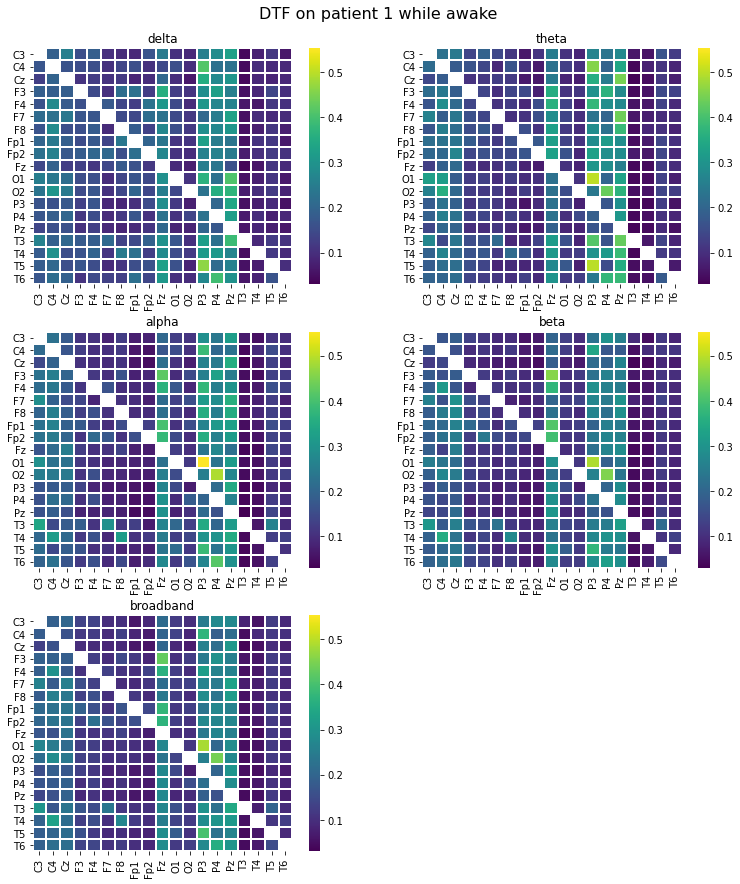

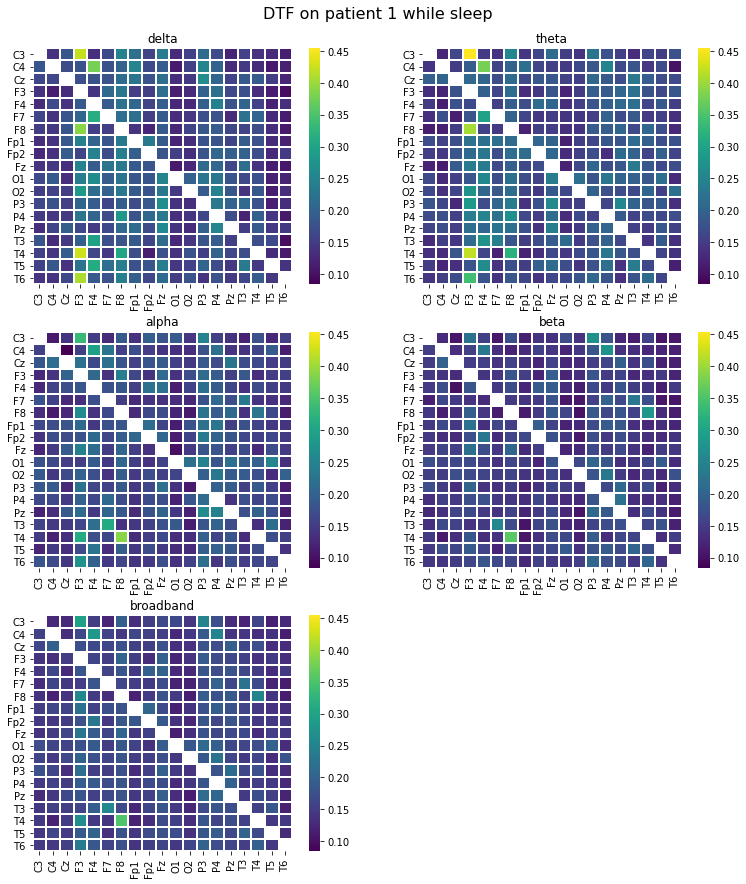

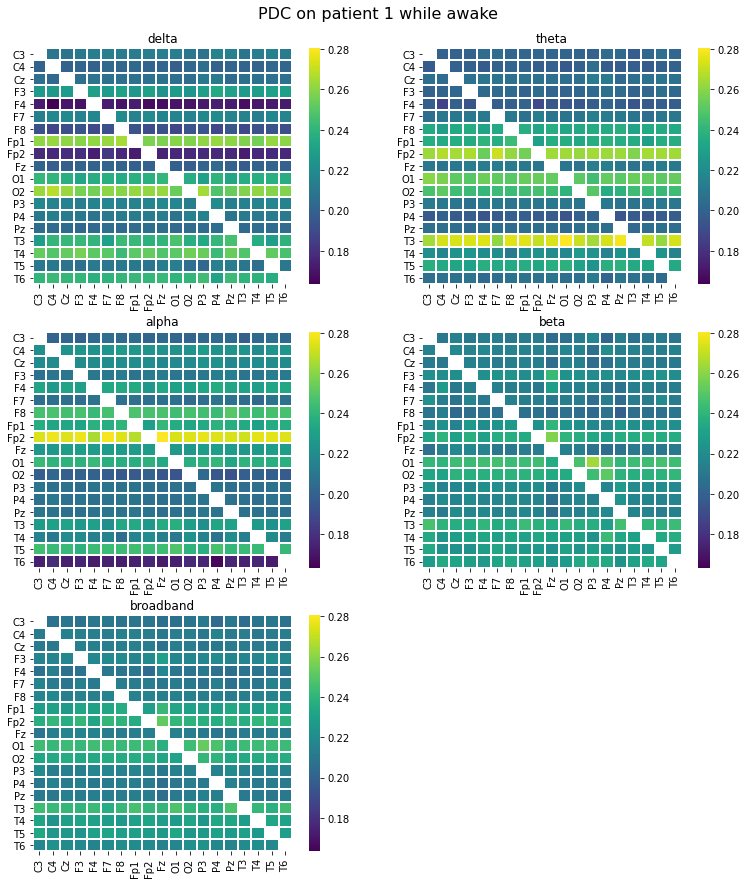

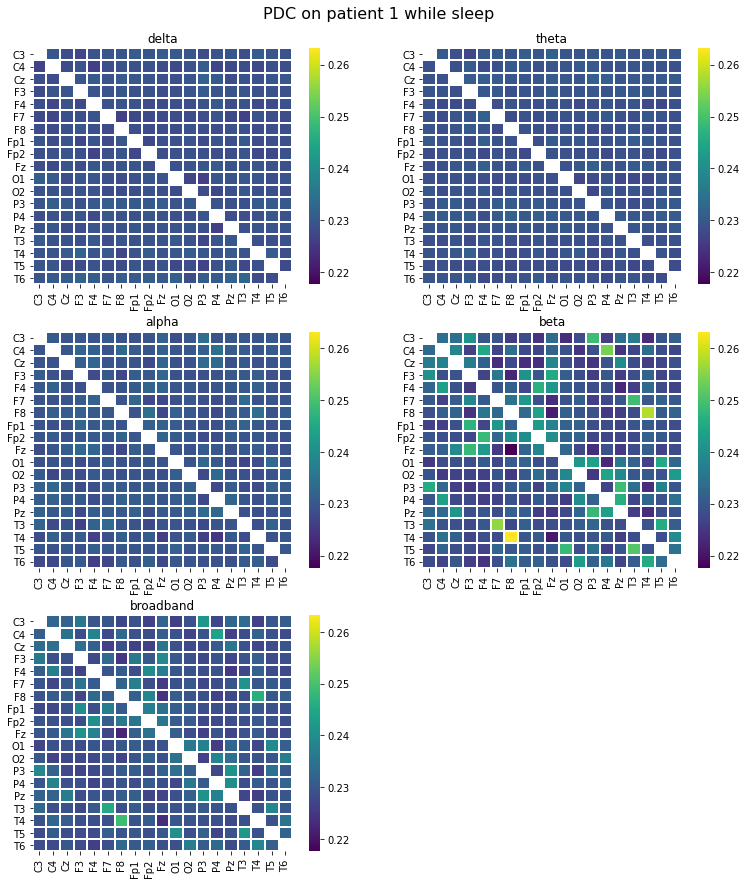

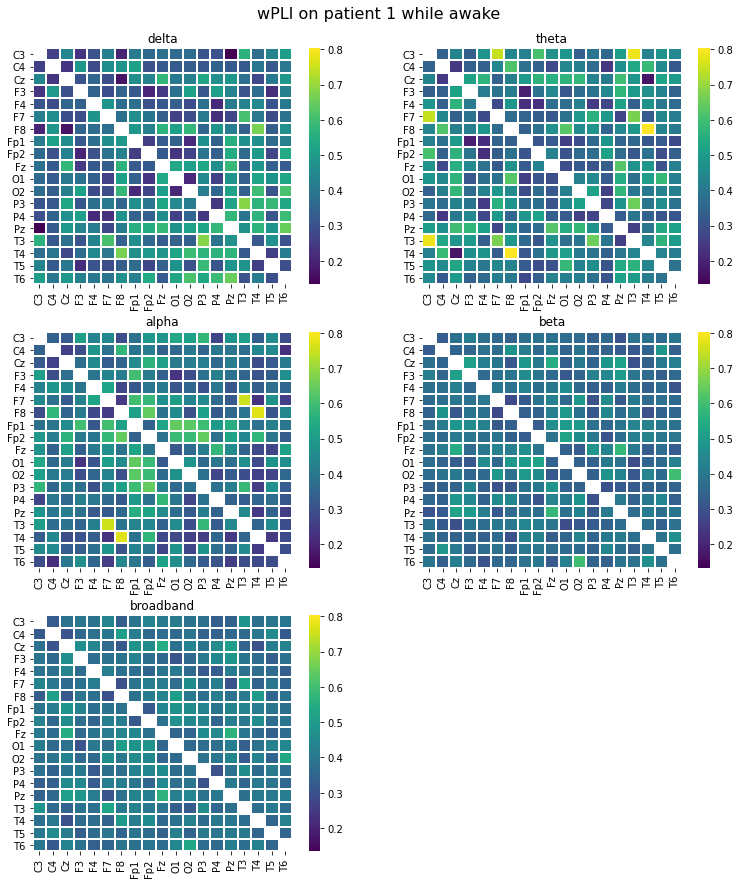

...

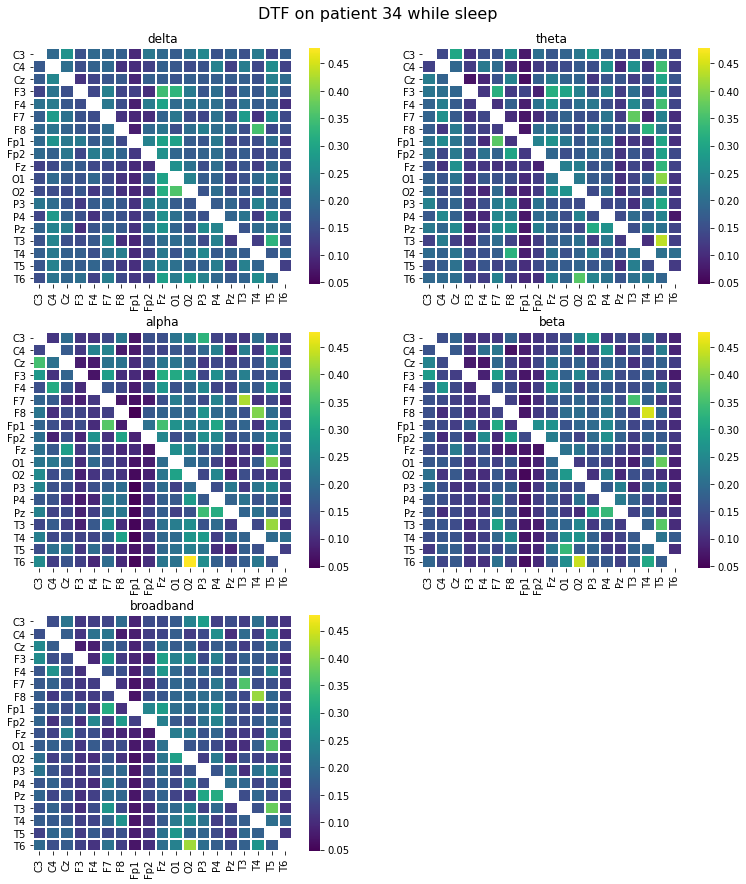

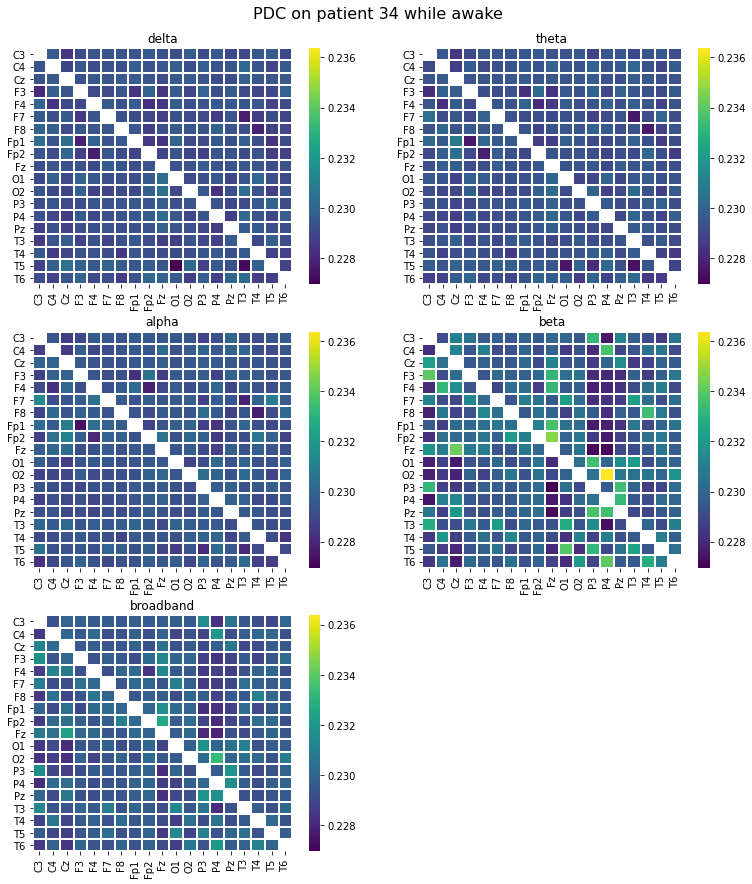

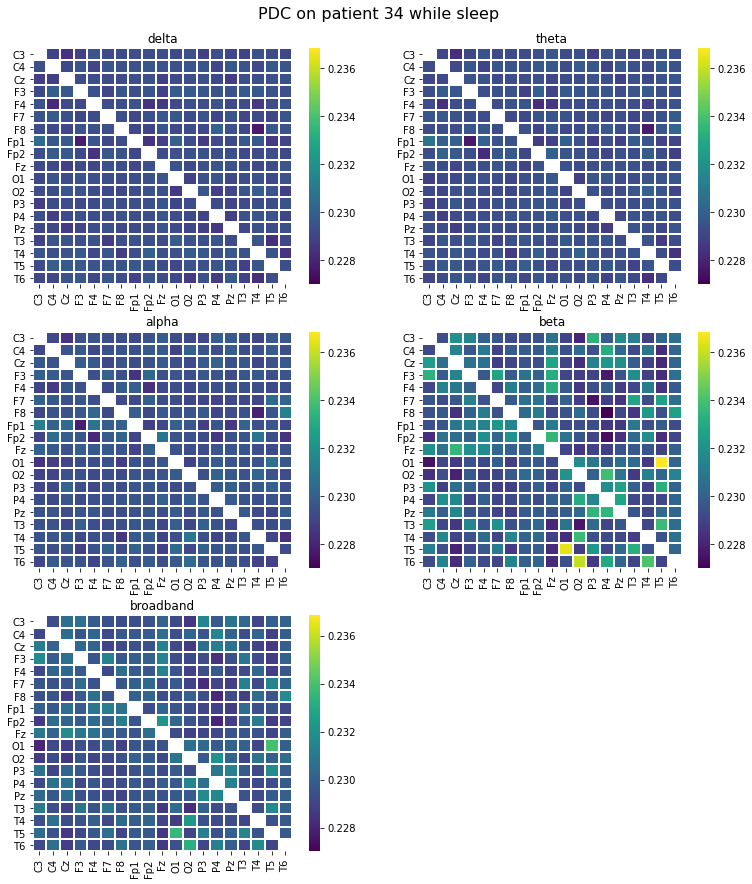

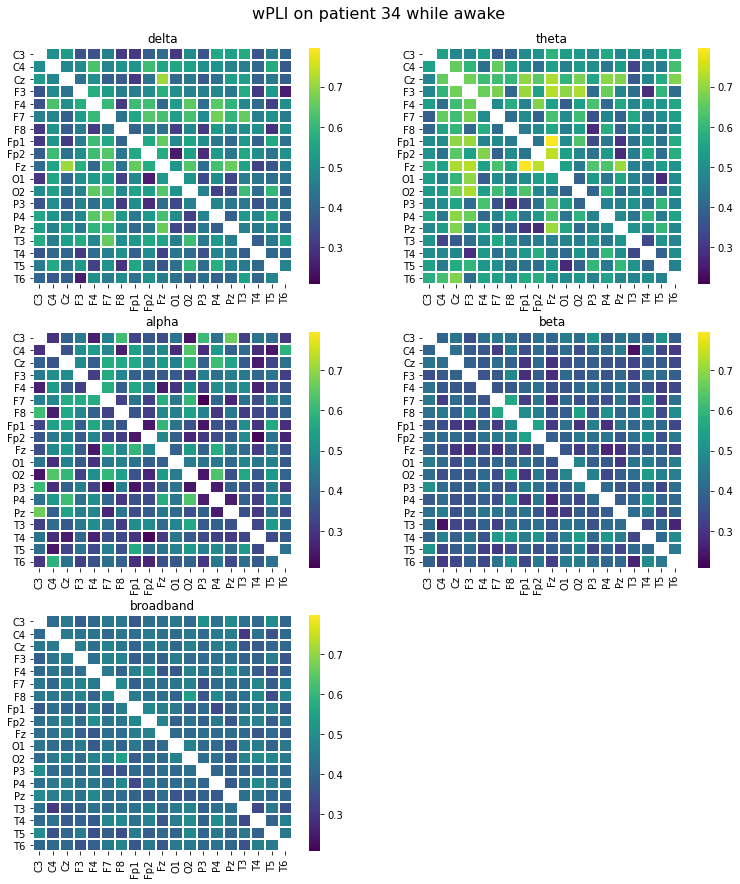

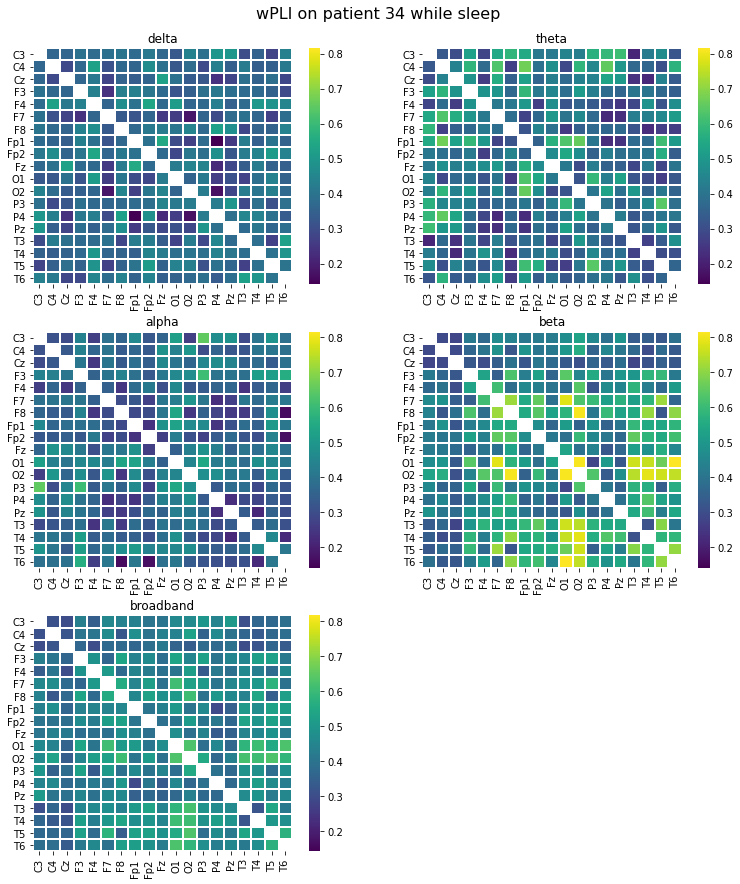

In [7]:
for pat_num in to_preprocess:
    patient_code = 'PAT'+str(pat_num)
    weaning = PAT_metadata[patient_code]
    epoched = prep.open_preprocessed_epoched(pat_num, weaning=weaning)
    a_awake, a_sleep = (epoched[0]).copy(), (epoched[1]).copy()
    cm_awake = cm.ConnectionsMatrices(a_awake, patient_number=pat_num, rec_status='awake')
    cm_sleep = cm.ConnectionsMatrices(a_sleep, patient_number=pat_num, rec_status='sleep')
    pickle.dump(cm_awake, open(direc_pickle+patient_code+'_'+'AWAKE.pickle', 'wb'))
    pickle.dump(cm_sleep, open(direc_pickle+patient_code+'_'+'SLEEP.pickle', 'wb'))
    for measure in ['DTF', 'PDC', 'wPLI']:
        cm_awake.plot_fbands_hmaps(measure=measure, hide_diag=True, savefigure=True, directory=direc)
        cm_sleep.plot_fbands_hmaps(measure=measure, hide_diag=True, savefigure=True, directory=direc)

### To create connectomes using the pickled connection matrices

In [4]:
data = {}
data['patient'] = []
for measure in ['DTF', 'PDC']:
    for f_band in ['delta', 'theta', 'alpha', 'beta', 'broadband']:
        data[measure +'_'+f_band+'_AWAKE_AVGBC'], data[measure +'_'+f_band+'_SLEEP_AVGBC'] = [], []
        data[measure +'_'+f_band+'_AWAKE_GE'], data[measure +'_'+f_band+'_SLEEP_GE'] = [], []
        data[measure +'_'+f_band+'_AWAKE_DA'], data[measure +'_'+f_band+'_SLEEP_DA'] = [], []
        data[measure +'_'+f_band+'_AWAKE_AVGCC'], data[measure +'_'+f_band+'_SLEEP_AVGCC'] = [], []
        data[measure +'_'+f_band+'_AWAKE_MOD'], data[measure +'_'+f_band+'_SLEEP_MOD'] = [], []
        data['wPLI_'+f_band+'_AWAKE_MEAN_SYNCH'], data['wPLI_'+f_band+'_SLEEP_MEAN_SYNCH'] = [], []

for pat_num in tqdm(to_preprocess):
    data['patient'].append(pat_num)
    patient_code = 'PAT'+str(pat_num)
    weaning = PAT_metadata[patient_code]
    cm_awake, cm_sleep = pickle.load(open(direc_pickle+patient_code+'_'+'AWAKE.pickle', 'rb')), pickle.load(open(direc_pickle+patient_code+'_'+'SLEEP.pickle', 'rb'))
    for measure in ['DTF', 'PDC']:
        cntome_awake, cntome_sleep = cntms.Connectomes(cm_awake, measure), cntms.Connectomes(cm_sleep, measure)
        
        avg_bc_awake, avg_bc_sleep = cntome_awake.avg_betweenness_centrality(), cntome_sleep.avg_betweenness_centrality()
        ge_awake, ge_sleep = cntome_awake.global_efficiency_weighted(), cntome_sleep.global_efficiency_weighted()
        da_awake, da_sleep = cntome_awake.degree_assortativity(), cntome_sleep.degree_assortativity()
        avg_cc_awake, avg_cc_sleep = cntome_awake.avg_clustering_coefficient(), cntome_sleep.avg_clustering_coefficient()
        mod_awake, mod_sleep = cntome_awake.modularity(), cntome_sleep.modularity()
        
        for f_band in cm_awake.f_bands:
            data[measure +'_'+f_band+'_AWAKE_AVGBC'].append(avg_bc_awake[f_band]), data[measure +'_'+f_band+'_SLEEP_AVGBC'].append(avg_bc_sleep[f_band])
            data[measure +'_'+f_band+'_AWAKE_GE'].append(ge_awake[f_band]), data[measure +'_'+f_band+'_SLEEP_GE'].append(ge_sleep[f_band])
            data[measure +'_'+f_band+'_AWAKE_DA'].append(da_awake[f_band]), data[measure +'_'+f_band+'_SLEEP_DA'].append(da_sleep[f_band])
            data[measure +'_'+f_band+'_AWAKE_AVGCC'].append(avg_cc_awake[f_band]), data[measure +'_'+f_band+'_SLEEP_AVGCC'].append(avg_cc_sleep[f_band])
            data[measure +'_'+f_band+'_AWAKE_MOD'].append(mod_awake[f_band]), data[measure +'_'+f_band+'_SLEEP_MOD'].append(mod_sleep[f_band])
    
    for f_band in cm_awake.f_bands:
        data['wPLI_'+f_band+'_AWAKE_MEAN_SYNCH'].append(cm_awake.wPLI[f_band].mean()), data['wPLI_'+f_band+'_SLEEP_MEAN_SYNCH'].append(cm_sleep.wPLI[f_band].mean())
        
DF = pd.DataFrame(data)

100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [02:33<00:00,  5.67s/it]


In [21]:
DF.filter(regex='AVGCC$',axis=1)

,DTF_delta_AWAKE_AVGCC,DTF_delta_SLEEP_AVGCC,DTF_theta_AWAKE_AVGCC,DTF_theta_SLEEP_AVGCC,DTF_alpha_AWAKE_AVGCC,DTF_alpha_SLEEP_AVGCC,DTF_beta_AWAKE_AVGCC,DTF_beta_SLEEP_AVGCC,DTF_broadband_AWAKE_AVGCC,DTF_broadband_SLEEP_AVGCC,PDC_delta_AWAKE_AVGCC,PDC_delta_SLEEP_AVGCC,PDC_theta_AWAKE_AVGCC,PDC_theta_SLEEP_AVGCC,PDC_alpha_AWAKE_AVGCC,PDC_alpha_SLEEP_AVGCC,PDC_beta_AWAKE_AVGCC,PDC_beta_SLEEP_AVGCC,PDC_broadband_AWAKE_AVGCC,PDC_broadband_SLEEP_AVGCC
0,0.262287,0.566107,0.252810,0.591369,0.238566,0.512108,0.293924,0.678110,0.276786,0.717653,0.759201,0.985963,0.850345,0.990873,0.755136,0.978192,0.895547,0.940543,0.924296,0.963847
1,0.335918,0.619934,0.358285,0.654758,0.447196,0.576672,0.400635,0.638953,0.399904,0.728055,0.933028,0.980781,0.950886,0.988090,0.946961,0.981666,0.893807,0.941946,0.945263,0.965724
2,0.710507,0.547892,0.744919,0.444949,0.766160,0.518126,0.775973,0.515445,0.768927,0.558875,0.522771,0.783541,0.550215,0.786656,0.463849,0.864504,0.570886,0.867440,0.569611,0.886871
3,0.534080,0.544706,0.525805,0.458905,0.567995,0.496044,0.565137,0.604689,0.565318,0.617552,0.589043,0.966802,0.705817,0.976793,0.692672,0.975876,0.638855,0.945903,0.678464,0.966230
4,0.184118,0.506019,0.173652,0.416752,0.222835,0.446704,0.378572,0.513469,0.300100,0.491643,0.819930,0.972968,0.784447,0.978745,0.880171,0.975788,0.928274,0.950953,0.889691,0.971213
5,0.361707,0.502414,0.276469,0.548355,0.336207,0.550433,0.415359,0.643544,0.447045,0.689900,0.773187,0.961757,0.769897,0.972583,0.768296,0.972705,0.828832,0.955411,0.865700,0.974990
6,0.622817,0.465590,0.671956,0.531012,0.636578,0.473473,0.725846,0.563140,0.717592,0.549656,0.535960,0.914626,0.526108,0.917318,0.508894,0.925040,0.567847,0.904431,0.553460,0.937881
7,0.668994,0.575231,0.727544,0.445148,0.650029,0.468991,0.777867,0.555853,0.760005,0.563747,0.717777,0.898070,0.759152,0.867280,0.701005,0.901289,0.724412,0.897283,0.742751,0.928576
8,0.897066,0.488681,0.894393,0.308603,0.890828,0.285482,0.901471,0.435067,0.907156,0.408903,0.443969,0.975473,0.502033,0.978574,0.499601,0.980212,0.496266,0.959896,0.512316,0.971414
9,0.452205,0.535237,0.442732,0.563130,0.429416,0.347235,0.497706,0.333972,0.494744,0.481320,0.646110,0.965956,0.680866,0.941938,0.709805,0.950297,0.712705,0.930805,0.733706,0.959423
